# **A Practical Guide About Exploring, Preparing, and Visualizing Data with Python**

*Prepared by*: Leandro Ariza-Jiménez (ariza.leandro@gmail.com)

# 1. Introduction

Data science begins with understanding and preparing your data, a crucial step before applying machine learning algorithms. In this notebook, we will explore a real-world dataset on housing in San Francisco to demonstrate key concepts such as retrieving, exploring, and cleaning data. We will also delve into the importance of data visualization and aggregation.

## Key Topics Covered

1. Retrieving Data: Loading CSV files and understanding tabular data.
2. Exploratory Data Analysis (EDA): Uncovering patterns and insights.
3. Data Aggregation: Summarizing data for better analysis.
4. Data Cleansing: Handling missing values, outliers, duplicates, and more.
5. Data Visualization: Using visual tools to explore trends and distributions.

We'll use the *sfhousing.csv* dataset throughout to balance both theory and Python implementation, working hands-on in each step.

# 2. Tabular Data

Most of the times, the structure of the data that we will be working with is on **tabular data**, where information is organized into **rows and columns**, similar to a table or spreadsheet:

- Each **row** typically represents an observation or a record.
- Each **column** represents a feature or variable about the observation.

This type of data is used frequently because it allows us to easily manipulate, analyze, and visualize different aspects of the data.

When working with data, it is common to encounter two different structures: **wide format** and **long format**. These formats are just two ways of organizing your data for different types of analysis or visualizations.

## 2.1. Wide Format

In the **wide format**, each row represents a single entity, and each column contains a different variable or measurement for that entity. This format is often used when working with spreadsheets or raw datasets.

**Example**

| ID  | Height | Weight |
| --- | ------ | ------ |
| 1   | 180    | 75     |
| 2   | 165    | 68     |

**Key points**  
- Each subject or entity is represented by a single row.
- Variables like `Height` and `Weight` are represented as separate columns.

## 2.2. Long Format

In the **long format**, each row represents a single observation of a variable. You might have multiple rows for the same subject or entity, with one column indicating the variable type (or category) and another column holding its value.

**Example**

| ID  | Category | Value |
| --- | -------- | ----- |
| 1   | Height   | 180   |
| 1   | Weight   | 75    |
| 2   | Height   | 165   |
| 2   | Weight   | 68    |

**Key points**
- Each subject or entity (in this case, an individual identified by an `ID`) appears multiple times, once for each measurement (Height, Weight).
- The `Category` column shows what is being measured, while the `Value` column contains the actual data.

# 3. About Python Libraries

When working in data science, we often handle large datasets, perform complex calculations, and visualize trends. Doing this without specialized tools would be time-consuming and error-prone.

In Python, these tools come in the form of **libraries**.

## 3.1. What is a Library?

In programming, a **library** is a collection of pre-written code that provides functionality we can use in our projects without having to write it ourselves.

Libraries help us:
- Save time and effort by using code that has already been developed and tested.
- Solve common problems more easily by providing functions for things like handling data, generating visualizations, and much more.

In this session, we'll work with some of the most popular libraries for data handling and visualization, such as **pandas**, **matplotlib**, **seaborn**, and **plotly**.

### Loading a Library

Before we can use a library in Python, we first need to import it into our current session. This is done using the `import` keyword. When we import a library, we make all of its tools and functions available for use in our code.

For example, to load the `pandas` library, we simply run:

In [5]:
import pandas

After running this, all the functionality provided by `pandas` can be accessed in our code.

### Using Aliases for Libraries

In practice, many libraries are imported using an alias (a shorter nickname). This helps to save typing, especially for frequently used libraries. For example, the `pandas` library is commonly imported as `pd`:

In [1]:
import pandas as pd

Now, every time we want to use something from the `pandas` library, we can type `pd` instead of the full word `pandas`, making our code more concise.

## 3.2. Introducing the `pandas` Library

One of the most important libraries in Python for working with data is called **`pandas`**.

It's widely used for data analysis and manipulation, especially when dealing with **tabular data** (like what we’ve seen in long and wide formats).

With `pandas`, we can:
- **Load** data from various file formats (e.g., CSV, Excel).
- **Manipulate** and clean data.
- **Analyze** data using descriptive statistics and summaries.
- **Prepare** data for visualization.

The core object in `pandas` is the **DataFrame**, which is essentially a table with rows and columns (similar to a spreadsheet or SQL table).

### What is a `DataFrame`?

A **DataFrame** is a two-dimensional, labeled data structure in `pandas` that can hold various types of data (numbers, text, etc.) in a table format.

There are many ways to create a DataFrame, but one of the most intuitive ways is to build it from a Python **dictionary**.

#### Creating a DataFrame from a Dictionary

We can create a DataFrame by passing a dictionary to the `pandas.DataFrame()` function. Each key in the dictionary represents a column name, and the corresponding value is a list of data for that column.

**Example**

In [7]:
# Creating a dictionary with data
data = {
    'Name': ['Alice', 'Bob', 'Charlie'],
    'Age': [25, 30, 35],
    'City': ['New York', 'Los Angeles', 'Chicago']
}

# Converting the dictionary to a DataFrame
df = pd.DataFrame(data)

# Displaying the DataFrame
df

,Name,Age,City
0,Alice,25,New York
1,Bob,30,Los Angeles
2,Charlie,35,Chicago


#### Loading a DataFrame from a CSV File

Another common way to obtain data is by loading it from an external source, such as a **CSV file**. CSV files are a popular format for storing tabular data, where each row of data is (usually) separated by commas.

We can load a CSV file into a pandas DataFrame using the `pd.read_csv()` function.

**Example**

In [3]:
# Loading data from a CSV file
df = pd.read_csv("datos/sfhousing.csv")

# Displaying the DataFrame
df

,county,city,zip,street,price,br,lsqft,bsqft,year,date,datesold
0,Alameda County,Alameda,94501.0,1001 Post Street,689000.0,4.0,4484.0,1982.0,1950.0,2004-08-29,NaN
1,Alameda County,Alameda,94501.0,1001 Santa Clara Avenue,880000.0,7.0,5914.0,3866.0,1995.0,2005-11-06,NaN
2,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#102,393000.0,2.0,39353.0,1360.0,1970.0,2003-09-21,NaN
3,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#108,485000.0,2.0,39353.0,1360.0,1970.0,2004-09-05,NaN
4,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#201,570000.0,2.0,39353.0,1360.0,1970.0,2005-07-31,NaN
...,...,...,...,...,...,...,...,...,...,...,...
521488,Sonoma County,Windsor,95492.0,9991 Blasi Drive,389500.0,NaN,2665.0,NaN,NaN,2008-02-17,NaN
521489,Sonoma County,Windsor,95492.0,9992 Wallace Way,437000.0,3.0,6180.0,1158.0,1993.0,2005-05-15,NaN
521490,Sonoma County,Windsor,95492.0,9998 Blasi Drive,392500.0,NaN,3111.0,NaN,NaN,2008-02-17,NaN
521491,Sonoma County,Windsor,95492.0,9999 Blasi Drive,414000.0,NaN,2915.0,NaN,NaN,2008-02-17,NaN


Using `pd.read_csv()`, pandas automatically reads the file, and the columns and rows are mapped directly into a DataFrame.

## 3.3. Introducing Python Visualization Libraries

Python offers several powerful libraries for creating visualizations, each with its strengths. The three most common libraries for data visualization in Python are `matplotlib`, `plotly`, and `seaborn`.

**`matplotlib`**

- It is one of the oldest and most widely used Python libraries for creating static plots.
- Its submodule, `pyplot`, provides a simple interface for quickly making basic charts like line plots, bar plots, histograms, and scatter plots.
- Useful when you need basic, static plots with fine-grained control.
- Import:

In [4]:
import matplotlib.pyplot as plt

**`seaborn`**
- It is built on top of `matplotlib`.
- Simplifies the creation of more complex statistical visualizations.
- Provides great aesthetics by default.
- Import:

In [5]:
import seaborn as sns

**`plotly`**
- It is is ideal for interactive plots that allow for zooming, hovering, and more.
- Its submodule, `express`, provides a simple and common interface for quickly making basic charts like line plots, bar plots, histograms, and scatter plots.
- It’s great for web-based visualizations.
- Import:

In [6]:
import plotly.express as px

# 4. Exploratory Data Analysis (EDA)

## 4.1. Introduction to EDA

### What is EDA?

- Exploratory Data Analysis (EDA) is the process of analyzing data sets to summarize their main characteristics, often using visual methods.
- It’s the first step in understanding a dataset before any formal modeling.
- EDA helps to uncover patterns, spot anomalies, test hypotheses, and check assumptions.

### Why is EDA important?

- Helps us understand the data structure and distribution.
- Identifies missing or incorrect data.
- Helps choose the right preprocessing methods for the dataset.
- Aids in understanding relationships between variables.

## 4.2.Understanding Data Structure

The first step in EDA is getting a sense of the data's structure:
-  Display the first/last few rows to get an initial sense of what the data looks like.
- How many records (rows) and features (columns) we are dealing with.
- What kinds of data types are present.

**Python Implementation**

In [7]:
# Preview the first few rows of the dataset
df.head()

,county,city,zip,street,price,br,lsqft,bsqft,year,date,datesold
0,Alameda County,Alameda,94501.0,1001 Post Street,689000.0,4.0,4484.0,1982.0,1950.0,2004-08-29,NaN
1,Alameda County,Alameda,94501.0,1001 Santa Clara Avenue,880000.0,7.0,5914.0,3866.0,1995.0,2005-11-06,NaN
2,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#102,393000.0,2.0,39353.0,1360.0,1970.0,2003-09-21,NaN
3,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#108,485000.0,2.0,39353.0,1360.0,1970.0,2004-09-05,NaN
4,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#201,570000.0,2.0,39353.0,1360.0,1970.0,2005-07-31,NaN


In [8]:
# Preview the last few rows of the dataset
df.tail()

,county,city,zip,street,price,br,lsqft,bsqft,year,date,datesold
521488,Sonoma County,Windsor,95492.0,9991 Blasi Drive,389500.0,NaN,2665.0,NaN,NaN,2008-02-17,NaN
521489,Sonoma County,Windsor,95492.0,9992 Wallace Way,437000.0,3.0,6180.0,1158.0,1993.0,2005-05-15,NaN
521490,Sonoma County,Windsor,95492.0,9998 Blasi Drive,392500.0,NaN,3111.0,NaN,NaN,2008-02-17,NaN
521491,Sonoma County,Windsor,95492.0,9999 Blasi Drive,414000.0,NaN,2915.0,NaN,NaN,2008-02-17,NaN
521492,Sonoma County,Windsor,95492.0,999 Gemini Drive,325000.0,3.0,7841.0,1092.0,1973.0,2003-09-21,NaN


In [9]:
# Displaying the shape of the dataset (rows, columns)
df.shape

(521493, 11)

In [10]:
# Listing all column names
df.columns

Index(['county', 'city', 'zip', 'street', 'price', 'br', 'lsqft', 'bsqft',
       'year', 'date', 'datesold'],
      dtype='object')

In [11]:
# Data types of each column
df.dtypes

county       object
city         object
zip         float64
street       object
price       float64
br          float64
lsqft       float64
bsqft       float64
year        float64
date         object
datesold     object
dtype: object

In [12]:
# Check the structure of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 521493 entries, 0 to 521492
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   county    521493 non-null  object 
 1   city      521493 non-null  object 
 2   zip       521464 non-null  float64
 3   street    521481 non-null  object 
 4   price     521493 non-null  float64
 5   br        421343 non-null  float64
 6   lsqft     435207 non-null  float64
 7   bsqft     444465 non-null  float64
 8   year      433840 non-null  float64
 9   date      521493 non-null  object 
 10  datesold  52102 non-null   object 
dtypes: float64(6), object(5)
memory usage: 43.8+ MB


## 4.3. Checking for Missing Data

- Missing data can lead to biased models or incorrect conclusions.
- It’s essential to identify and handle missing values before proceeding with analysis or modeling.

**Python Implementation**

In [13]:
df.isnull().sum().reset_index().rename(columns={"index":"variable", 0:"na_count"})

,variable,na_count
0,county,0
1,city,0
2,zip,29
3,street,12
4,price,0
5,br,100150
6,lsqft,86286
7,bsqft,77028
8,year,87653
9,date,0


In [14]:
# Checking for missing values in each column
missing_ft = df.isnull().sum().reset_index().rename(columns={"index":"variable", 0:"na_count"})
missing_ft["na_perc"] = 100*missing_ft["na_count"]/df.shape[0]
missing_ft.sort_values(by="na_perc", ascending=False)

,variable,na_count,na_perc
10,datesold,469391,90.009070
5,br,100150,19.204476
8,year,87653,16.808088
6,lsqft,86286,16.545956
7,bsqft,77028,14.770668
2,zip,29,0.005561
3,street,12,0.002301
1,city,0,0.000000
0,county,0,0.000000
4,price,0,0.000000


Based on the above frequency table, we can observe that datesold is almost incomplete and we should discard it in the future.

## 4.4. Checking for Duplicates

Duplicate data can skew analysis by giving more weight to repeated records, so it’s crucial to identify and remove any duplicates.

**Python Implementation**

In [15]:
# Checking for duplicate rows
df.duplicated().sum()

np.int64(0)

In [16]:
# Checking for duplicate rows
dup_homes = df.duplicated(subset=["county", "zip", "city", "street"])
dup_homes.sum()

np.int64(85370)

In [17]:
# Displaying duplicate rows (optional)
df[dup_homes] # This is called 'boolean indexing'

,county,city,zip,street,price,br,lsqft,bsqft,year,date,datesold
9,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#303,470000.0,2.0,39353.0,1360.0,1970.0,2007-09-30,NaN
12,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#307,515000.0,2.0,39353.0,1360.0,1970.0,2005-02-13,NaN
16,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#405,540000.0,2.0,39353.0,1360.0,1970.0,2006-06-11,NaN
25,Alameda County,Alameda,94501.0,1007 Morton Street,1330000.0,4.0,7500.0,2811.0,1898.0,2007-02-04,NaN
33,Alameda County,Alameda,94501.0,1010 San Antonio Avenue,680000.0,2.0,4050.0,1504.0,1930.0,2005-08-14,NaN
...,...,...,...,...,...,...,...,...,...,...,...
521439,Sonoma County,Windsor,95492.0,9807 Rosina Court,395000.0,3.0,6534.0,1553.0,1989.0,2003-11-23,NaN
521452,Sonoma County,Windsor,95492.0,9876 Blasi Drive,375500.0,3.0,5663.0,1120.0,1993.0,2003-10-19,NaN
521463,Sonoma County,Windsor,95492.0,9958 Troon Court,1150000.0,4.0,21000.0,3475.0,1998.0,2008-02-10,NaN
521464,Sonoma County,Windsor,95492.0,9958 Troon Court,1265000.0,4.0,21000.0,3475.0,1998.0,2006-01-01,NaN


In [18]:
# Displaying records for a particular duplicated home
df.query("county == 'Sonoma County' and city == 'Windsor' and zip == 95492 and street == '9958 Troon Court'")

,county,city,zip,street,price,br,lsqft,bsqft,year,date,datesold
521462,Sonoma County,Windsor,95492.0,9958 Troon Court,1100000.0,4.0,20909.0,3475.0,1998.0,2004-08-29,NaN
521463,Sonoma County,Windsor,95492.0,9958 Troon Court,1150000.0,4.0,21000.0,3475.0,1998.0,2008-02-10,NaN
521464,Sonoma County,Windsor,95492.0,9958 Troon Court,1265000.0,4.0,21000.0,3475.0,1998.0,2006-01-01,NaN


## 4.4. Summary Statistics

- Summary statistics are helpful to quickly understand the ranges and distributions of numerical variables.
- For qualitative variables, frequency analysis should be performed.

**Python Implementation**

In [19]:
# Get summary statistics for numerical columns
df.describe()

,zip,price,br,lsqft,bsqft,year
count,521464.000000,5.214930e+05,421343.000000,4.352070e+05,4.444650e+05,433840.000000
mean,94690.382579,6.354450e+05,3.050061,5.432386e+04,1.671481e+03,1966.043048
std,398.620806,3.939694e+05,1.045551,2.361588e+06,1.480836e+04,51.844148
min,93451.000000,2.200000e+04,1.000000,8.000000e+00,7.600000e+01,0.000000
25%,94519.000000,4.100000e+05,2.000000,3.850000e+03,1.130000e+03,1953.000000
50%,94582.000000,5.550000e+05,3.000000,5.750000e+03,1.452000e+03,1971.000000
75%,95035.000000,7.440000e+05,4.000000,7.840000e+03,1.926000e+03,1986.000000
max,95820.000000,2.000000e+07,90.000000,4.186116e+08,8.944000e+06,7700.000000


In [20]:
# Get summary statistics for numerical columns
df.describe(include=object)

,county,city,street,date,datesold
count,521493,521493,521481,521493,52102
unique,13,244,433779,291,194
top,Santa Clara County,San Francisco,900 Cambridge Drive,2004-10-10,08-29-08
freq,118700,33807,86,3357,996


## 4.5. Exploring Categorical Data

- Use **frequency tables** and **bar plots** to understand the distribution of categorical variables.
- These tools will help identify if certain categories are over- or under-represented.

**Exploring County Variable**

A frequency table based on the county variable reveals that approximately 80% of the sold houses are concentrated in just 5 counties, which represent about 29% of all counties:

In [21]:
# Generate a frequency table for county variable
county_ft = df["county"].value_counts().reset_index()
county_ft["percent"] = 100*county_ft["count"]/county_ft["count"].sum()
county_ft["cum_perc"] = county_ft["percent"].cumsum()
county_ft

,county,count,percent,cum_perc
0,Santa Clara County,118700,22.761571,22.761571
1,Contra Costa County,108175,20.743327,43.504898
2,Alameda County,105113,20.156167,63.661065
3,Solano County,40940,7.850537,71.511602
4,San Mateo County,40246,7.717457,79.229060
5,Sonoma County,36720,7.041322,86.270381
6,San Francisco County,33808,6.482925,92.753306
7,Marin County,17546,3.364571,96.117877
8,Napa County,10220,1.959758,98.077635
9,San Joaquin County,6057,1.161473,99.239108


The following bar plots visualize the above frequency table:

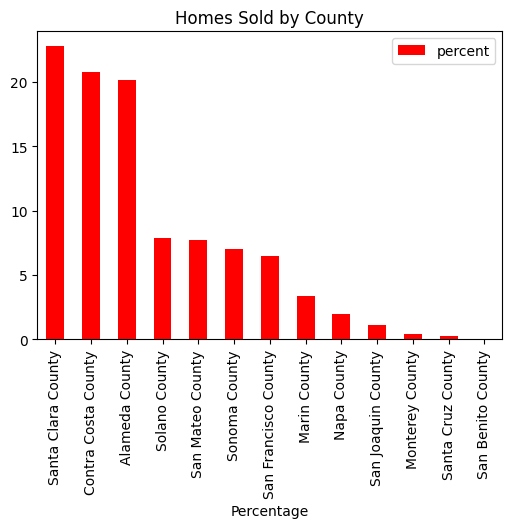

In [27]:
# Bar plot to visualize the above frequency table
county_ft.plot(
    kind="bar", figsize=(6,4),
    x="county", y="percent",
    title="Homes Sold by County",
    xlabel="Percentage",
    color="red"
);

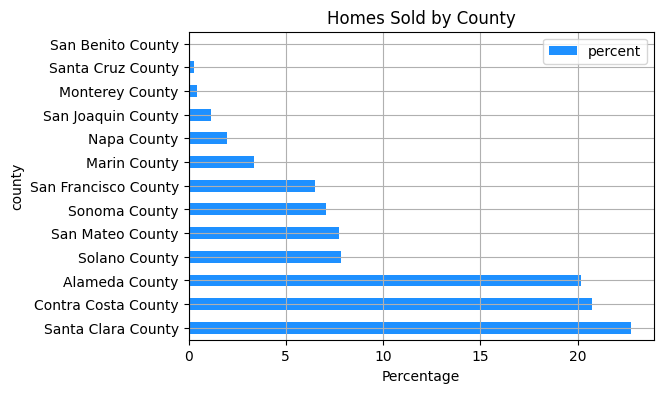

In [28]:
# Bar plot to visualize the above frequency table
county_ft.plot(
    kind="barh", figsize=(6,4), grid=True,
    x="county", y="percent",
    title="Homes Sold by County",
    xlabel="Percentage",
    color="dodgerblue",
);

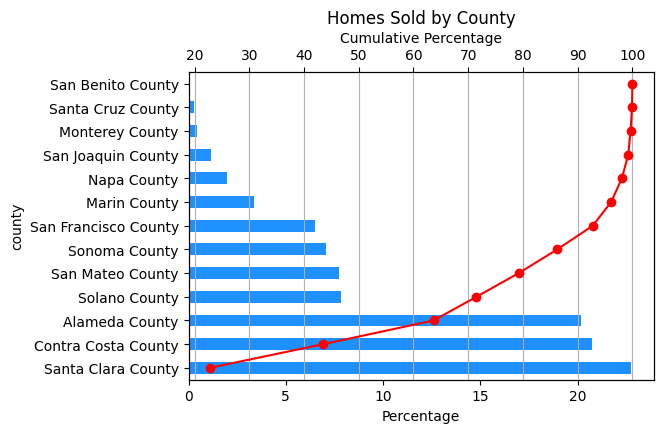

In [29]:
import matplotlib.pyplot as plt

# First, plot the bar chart
fig, ax = plt.subplots(figsize=(6, 4))
county_ft.plot(
    kind="barh", x="county", y="percent", color="dodgerblue",
    ax=ax, legend=False
)

# Then, plot the cumulative percentage line on the same axes
ax2 = ax.twiny()  # Create a twin axis to overlay the line plot
ax2.plot(county_ft["cum_perc"], county_ft["county"], color="red", marker="o", linestyle="-", label="Cumulative %")

# Adding labels and title
ax.set_title("Homes Sold by County")
ax.set_xlabel("Percentage")
ax2.set_xlabel("Cumulative Percentage")

# Adding grid to the cumulative line axis
ax2.grid(True)  # Optionally, you can hide the grid for the second axis

# Show both plots
plt.show()

**Exploring City**

Similarly, nearly 80% of the houses are sold in approximately 20% of the cities listed in the dataset.

In [22]:
# Generate a frequency table for city variable
city_ft = df["city"].value_counts().reset_index()
city_ft["percent"] = 100*city_ft["count"]/city_ft["count"].sum()
city_ft["cum_perc"] = city_ft["percent"].cumsum()
city_ft.head(50)

,city,count,percent,cum_perc
0,San Francisco,33807,6.482733,6.482733
1,Oakland,25938,4.973796,11.456530
2,San Jose,18161,3.482501,14.939031
3,Santa Rosa,16371,3.139256,18.078287
4,Fremont,15950,3.058526,21.136813
5,Evergreen,12470,2.391211,23.528024
6,Antioch,12065,2.313550,25.841574
7,Vallejo,11572,2.219013,28.060588
8,Hayward,11206,2.148830,30.209418
9,Fairfield,11151,2.138284,32.347702


**Exploring Number of Bedrooms**

Although this is a discrete quantitative variable, we can treat it as qualitative and create a bar plot. Since Bay Area houses tend to be smaller, we expect the distribution to peak at lower bedroom counts:

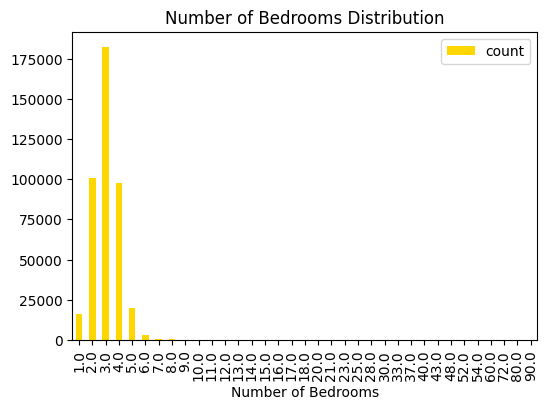

In [23]:
# Generate a bar plot for number of bedrooms variable
br_ft = df["br"].value_counts().reset_index().sort_values(by="br")

# Bar plot to visualize the above frequency table
br_ft.plot(
    kind="bar", figsize=(6,4),
    x="br", y="count",
    title="Number of Bedrooms Distribution",
    xlabel="Number of Bedrooms",
    color="gold",
);

However, we find that there are some houses with over 90 bedrooms. That’s a bit hard to believe and points
to another possible data quality problem. The following summary statistics shows that 99.9% of homes has at most 8 bedrooms. In particular, below this value, the bedroom distribution is nearly simmetric.

In [24]:
df.br.describe(percentiles=[0.25, 0.5, 0.75, 0.999])

count    421343.000000
mean          3.050061
std           1.045551
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
99.9%         8.000000
max          90.000000
Name: br, dtype: float64

**Exploring Year of Construction**

Let's take an in-depth look at the year of construction records. The results indicate that the extreme and anomalous values are 0 and 7700.

In [84]:
df.year.describe().transpose()

count    433840.000000
mean       1966.043048
std          51.844148
min           0.000000
25%        1953.000000
50%        1971.000000
75%        1986.000000
max        7700.000000
Name: year, dtype: float64

If we ignore the missing values and count the number of digits in each year, we find that most years are in a 4-digit format.

In [96]:
df.year.dropna().astype(int).astype(str).str.len().value_counts()

year
4    433609
2       188
1        42
3         1
Name: count, dtype: int64

Regarding years in the 4-digit format, if we limit ourselves to those starting with '1' or '2'—which is a reasonable decision—the minimum and maximum years are 1848 and 2008, respectively.

In [101]:
boolean_mask = (
    (df.year.dropna().astype(int).astype(str).str.len() == 4) &
    (df.year.dropna().astype(int).astype(str).str.startswith(("1", "2")))
)
df.year.dropna()[boolean_mask].describe()

count    433601.000000
mean       1967.009274
std          24.340917
min        1848.000000
25%        1953.000000
50%        1971.000000
75%        1986.000000
max        2008.000000
Name: year, dtype: float64

## 4.5. Exploring Numerical Data

The goal of exploring numerical data is understanding its distribution, identifying patterns, and spotting potential anomalies like outliers.

Here, we'll cover common visualization tools for numerical data such as **histograms** and **boxplots**.

#### Histograms

A histogram is a bar plot that shows the frequency distribution of a continuous numerical variable. The x-axis represents intervals or "bins," and the y-axis shows the count (or proportion) of values that fall within each bin.

About bin size:
- Binning is crucial to histograms.
- Smaller bin sizes may reveal fine details, while larger bin sizes may give a general overview.

Why Use It:
- To visualize the distribution of a dataset:
    - Normal distribution: Symmetrical bell curve.
    - Right-skewed: Tail to the right; common in income or housing prices.
    - Left-skewed: Tail to the left.
    - Multi-modal: More than one peak, indicating subgroups within the data.
- To identify features like skewness (asymmetry) or modality (peaks).
- To detect potential outliers.

#### Boxplots

A box plot (also known as a whisker plot) provides a graphical summary of one or more sets of data and shows the median, quartiles, and potential outliers.

In [33]:
from IPython.display import Image
from IPython.core.display import HTML
Image(
    url= "https://cdn1.byjus.com/wp-content/uploads/2020/10/Box-Plot-and-Whisker-Plot-1.png",
    width=600, height=300
)

**Boxplot Key Components**

- **Lower Whisker:** Smallest data point within 1.5 times the IQR below Q1.
- **Q1 (First Quartile):** 25th percentile, where 25% of data falls below.
- **Median:** 50th percentile, where 50% of data falls below it.
- **Q3 (Third Quartile):** 75th percentile, where 75% of data falls below.
- **Upper Whisker:** Largest data point within 1.5 times the IQR above Q3.
- **Outliers:** Points beyond the whiskers, plotted as individual points.
- **Min:** Smallest value in the dataset (if no outliers).
- **Max:** Largest value in the dataset (if no outliers).
- **Interquartile Range (IQR):** Box between Q1 and Q3, containing central 50% of the data.
- **Whiskers:** Represent the range of data within the IQR but outside the box (non-outliers).

##### Python Implementation

**Exploring Year of Construction**

Using sales records from 1800 to 2008, we can construct a histogram to visually explore trends in annual house sales. Notably, there are clear peaks around the 1920s and between 1950 and 1990, followed by a decline after 2000.

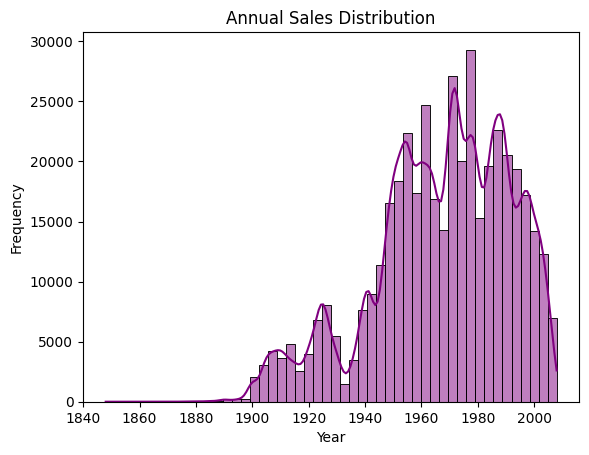

In [122]:
sns.histplot(
    data=df.dropna(subset=["year"]).query("1800 <= year <= 2008"),
    x="year", bins=50, kde=True,
    color="purple", alpha=0.5
)
plt.title("Annual Sales Distribution")
plt.xlabel("Year")
plt.ylabel("Frequency")
plt.show()

**Exploring Price**

The following summary statistics and histogram confirm that price is highly skewed to the rigth with a few very expensive house:

In [25]:
df.price.describe(percentiles=[0.25, 0.5, 0.75, 0.99, 0.999, 0.9999])

count     5.214930e+05
mean      6.354450e+05
std       3.939694e+05
min       2.200000e+04
25%       4.100000e+05
50%       5.550000e+05
75%       7.440000e+05
99%       2.110000e+06
99.9%     3.950000e+06
99.99%    7.500000e+06
max       2.000000e+07
Name: price, dtype: float64

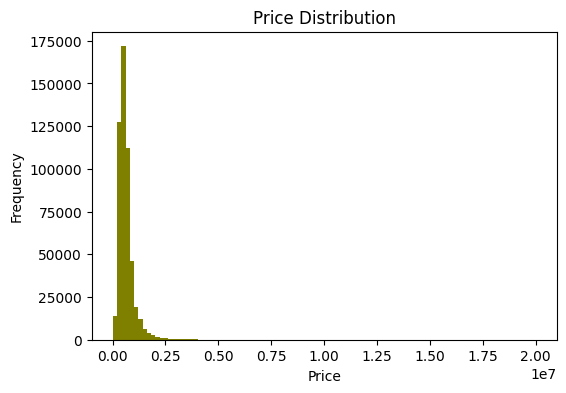

In [26]:
# Histogram to check price distribution
df["price"].plot(
    kind="hist", figsize=(6,4), bins=100,
    title="Price Distribution",
    xlabel="Price",
    color="olive"
);

We see that the 99.9% of the houses were sold under $4M, so let's examine the histogram of sales prices below this value:

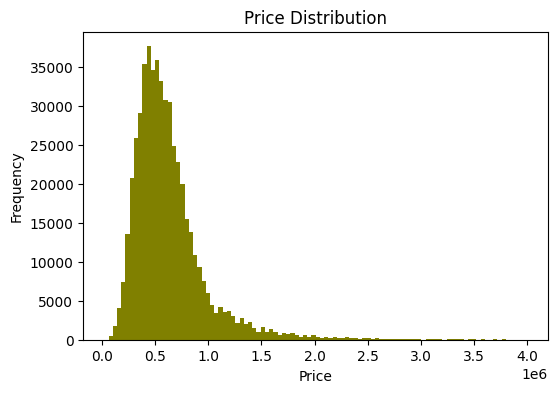

In [27]:
# Histogram to check price distribution
df.query("price < 4000000").price.plot(
    kind="hist", figsize=(6,4), bins=100,
    title="Price Distribution",
    xlabel="Price",
    color="olive"
);

Even without the top 0.1%, the distribution remains highly skewed to the right, with a single mode around $500,000.

**Exploring Lot and Building Size**

Since the size of the house and the property are likely related to its price, it seems reasonable to guess that these features are also skewed to the right. The following summary statistics and histograms confirm that both features are highly skewed, even more than price:

In [28]:
df.filter(items=["lsqft", "bsqft"]).describe(percentiles=[0.25, 0.5, 0.75, 0.99, 0.999, 0.9999])

,lsqft,bsqft
count,4.352070e+05,4.444650e+05
mean,5.432386e+04,1.671481e+03
std,2.361588e+06,1.480836e+04
min,8.000000e+00,7.600000e+01
25%,3.850000e+03,1.130000e+03
50%,5.750000e+03,1.452000e+03
75%,7.840000e+03,1.926000e+03
99%,1.472330e+05,4.100000e+03
99.9%,1.709690e+06,6.197536e+03
99.99%,1.089000e+08,2.414185e+04


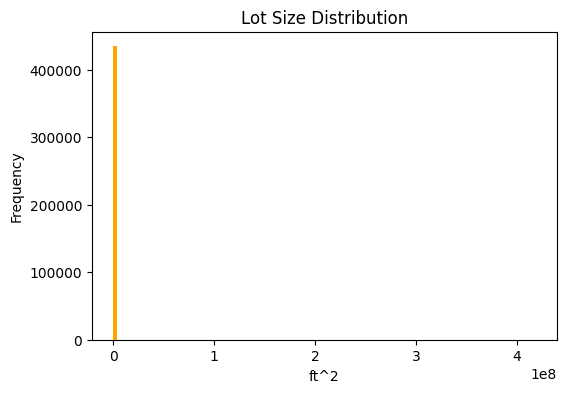

In [29]:
# Histogram to check lot size distribution
df["lsqft"].plot(
    kind="hist", figsize=(6,4), bins=100,
    title="Lot Size Distribution",
    xlabel="ft^2",
    color="orange"
);

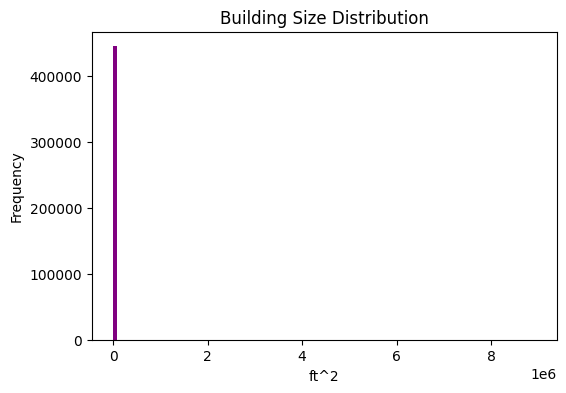

In [30]:
# Histogram to check house size distribution
df["bsqft"].plot(
    kind="hist", figsize=(6,4), bins=100,
    title="Building Size Distribution",
    xlabel="ft^2",
    color="purple"
);

For convenience, let's zoom into values below the 99th percentile:

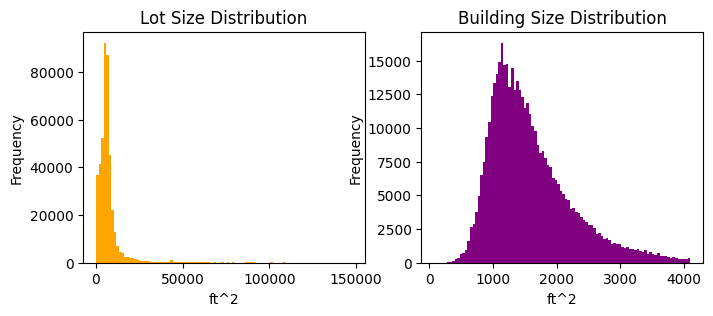

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

# Histogram to check lot size distribution
df.query("lsqft < 148000").lsqft.plot(
    kind="hist", bins=100,
    title="Lot Size Distribution",
    xlabel="ft^2",
    color="orange",
    ax=axes[0]
);

# Histogram to check house size distribution
df.query("bsqft < 4100").bsqft.plot(
    kind="hist", bins=100,
    title="Building Size Distribution",
    xlabel="ft^2",
    color="purple",
    ax=axes[1]
);

# 5. Data Wrangling

## 5.1. What is Data Wrangling?

Data wrangling (or data munging) is the process of cleaning and transforming raw data into a format that is suitable for analysis.

Why is it important?:
- Real-world data is often messy, incomplete, or inconsistent.
- Proper wrangling ensures that the data is accurate, complete, and ready for use in models or analyses.

In practice, there are three common tasks involved in the data wrangling process:
- Data cleaning
- Data transformation
- Data enrichment

## 5.2. Data Cleaning

Tipically, data cleaning involves the following essential tasks:

- Renaming columns
- Sorting and reordering
- Data type conversions
- Removing duplicates
- Handling missing or invalid data
- Filtering for the desired subset

Based on the preliminary EDA, we will limit our focus to renaming some columns, performing data type conversions, handling missing data, and filtering the dataset. However, these tasks will performed on a copy of our dataset:

In [32]:
# Make a copy of our dataset
df_prep = df.copy()

In [33]:
# Rename some columns
df_prep = df_prep.rename(columns={"year": "construction_year", "date": "date_sold"})
df_prep.head()

,county,city,zip,street,price,br,lsqft,bsqft,construction_year,date_sold,datesold
0,Alameda County,Alameda,94501.0,1001 Post Street,689000.0,4.0,4484.0,1982.0,1950.0,2004-08-29,NaN
1,Alameda County,Alameda,94501.0,1001 Santa Clara Avenue,880000.0,7.0,5914.0,3866.0,1995.0,2005-11-06,NaN
2,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#102,393000.0,2.0,39353.0,1360.0,1970.0,2003-09-21,NaN
3,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#108,485000.0,2.0,39353.0,1360.0,1970.0,2004-09-05,NaN
4,Alameda County,Alameda,94501.0,1001 Shoreline Drive \#201,570000.0,2.0,39353.0,1360.0,1970.0,2005-07-31,NaN


In [34]:
# Fill missing values in zip variable with -1 and
# convert it into a qualitative variable
df_prep["zip"] = df_prep["zip"].fillna(-1).astype(int).astype(str)

In [35]:
# Fill missing values in br variable with -1
# br_imput = df_prep["br"].median()
df_prep["br"] = df_prep["br"].fillna(-1).astype(int)

In [36]:
# Fill missing values in year variable with -1 and
# convert anomalous values to -1
df_prep["construction_year"] = df_prep["construction_year"].fillna(-1).astype(int)
df_prep["construction_year"] = [year if 1800 <= year <= 2008 else -1 for year in df_prep["construction_year"]]

In [37]:
# Filter dataset to limit the influence of the
# very expensive and large houses. Additionally,
# discard datesold variable as well as houses without
# street information
df_prep = (
    df_prep
    .query("price < 7_500_000 and bsqft < 242_000") # 99.99%
    .drop(columns=["datesold"])
    .dropna(subset=["street"])
)
df_prep

,county,city,zip,street,price,br,lsqft,bsqft,construction_year,date_sold
0,Alameda County,Alameda,94501,1001 Post Street,689000.0,4,4484.0,1982.0,1950,2004-08-29
1,Alameda County,Alameda,94501,1001 Santa Clara Avenue,880000.0,7,5914.0,3866.0,1995,2005-11-06
2,Alameda County,Alameda,94501,1001 Shoreline Drive \#102,393000.0,2,39353.0,1360.0,1970,2003-09-21
3,Alameda County,Alameda,94501,1001 Shoreline Drive \#108,485000.0,2,39353.0,1360.0,1970,2004-09-05
4,Alameda County,Alameda,94501,1001 Shoreline Drive \#201,570000.0,2,39353.0,1360.0,1970,2005-07-31
...,...,...,...,...,...,...,...,...,...,...
521480,Sonoma County,Windsor,95492,9980 Brooks Road,650000.0,3,45738.0,1200.0,1904,2004-10-24
521484,Sonoma County,Windsor,95492,9987 Wallace Way,356000.0,3,6300.0,1510.0,1991,2008-03-30
521486,Sonoma County,Windsor,95492,998 Polaris Drive,350000.0,4,8190.0,1196.0,1973,2007-08-05
521489,Sonoma County,Windsor,95492,9992 Wallace Way,437000.0,3,6180.0,1158.0,1993,2005-05-15


After filtering the original dataset, we discard arount the 15% of homes.

## 5.3. Data Transformation

Data transformation involves restructuring your dataset to facilitate analysis, often by changing which data goes along the rows and columns. This process may be necessary even before data cleaning if the dataset is unusable in its current shape.

Key aspects of data transformation include:
- **Restructuring formats:** Changing the data from long to wide format, or vice versa, based on the analysis requirements.
- **Transposing:** Swapping rows and columns to better utilize display space in dataframes.

**Reviewing Summary Statistics**

In particular, we can transpose the summary statistics table to improve readability when the number of columns is large:

In [38]:
df_prep.describe().T

,count,mean,std,min,25%,50%,75%,max
price,444410.0,633360.168867,3.852828e+05,22000.0,408000.0,550500.0,740000.0,7300000.0
br,444410.0,2.832934,1.350124e+00,-1.0,2.0,3.0,4.0,90.0
lsqft,406305.0,55901.664973,2.435199e+06,8.0,3828.0,5700.0,7680.0,418611600.0
bsqft,444410.0,1629.028784,9.501453e+02,76.0,1130.0,1452.0,1926.0,138642.0
construction_year,444410.0,1913.929322,3.197810e+02,-1.0,1951.0,1970.0,1986.0,2008.0


## 5.4. Data Enrichment

Data enrichment goal is to improve data quality and make it more useful for modeling and machine learning. It involves either merging new data or transforming the original data to create new insights.

Some common ways to enrich data include:

- **Adding new columns:** Creating new values based on existing data.
- **Binning:** Grouping continuous or highly distinct data into categories.
- **Aggregating:** Summarizing data by rolling it up.
- **Resampling:** Aggregating time series data at specific intervals.

**Reviewing Number of Bedrooms**

In order to improve our preliminary EDA, we will proceed to transform the number of bedrooms into an ordinal feature by grouping all values greater than 8 into an "8+" category, then re-create the bar plot with the transformed data:

In [39]:
new_br_cats = ["-1", "1", "2", "3", "4", "5", "6", "7", "8", "8+"]

df_prep["new_br"] = ["8+" if br > 8 else str(br) for br in df_prep["br"]]
df_prep["new_br"] = pd.Categorical(
    df_prep["new_br"], ordered=True,
    categories=new_br_cats
)

In [40]:
fig = px.histogram(
    df_prep, x="new_br",
    category_orders={
        "new_br": new_br_cats, # Ensure the order of bedrooms
    },
    title="Number of Bedrooms Distribution",
    labels={"new_br": "Bedrooms"},
    width=640, height=480
)

# Show the plot
fig.show()

We can also analyze the distribution of the number of bedrooms across different cities. Below is a comparison, using violin plots, for several cities in the San Francisco East Bay. Notably, the first two cities, located in the north, exhibit similar distributions, while the southern cities show distinctly different patterns.

In [41]:
# Define the cities of interest
sf_east_bay_cities = ["Richmond", "El Cerrito", "Albany", "Berkeley", "Emeryville"]

# Create the plot with facetting by city and ensure the order of the cities
fig = px.histogram(
    df_prep.query("city in @sf_east_bay_cities"),
    x="new_br",
    category_orders={
        "new_br": new_br_cats, # Ensure the order of bedrooms
        "city": sf_east_bay_cities # Ensure the order of cities
    },
    facet_col="city", # Create facets per city
    facet_col_spacing=0.05, # Increase space between facets
    title="Number of Bedrooms Across SF East Bay Cities",
    labels={"new_br": "Bedrooms"},
    width=1000, height=300
)

# Update the layout to get facets with independent vertical axes
fig.update_yaxes(matches=None, showticklabels=True)

# Show the plot
fig.show()

Additionally, we can examine how price distribution varies across houses with different bedroom counts using box plots. The median sale price increases from one to five bedrooms, but for houses with more than six bedrooms, the price distribution seems to hit a plateau.

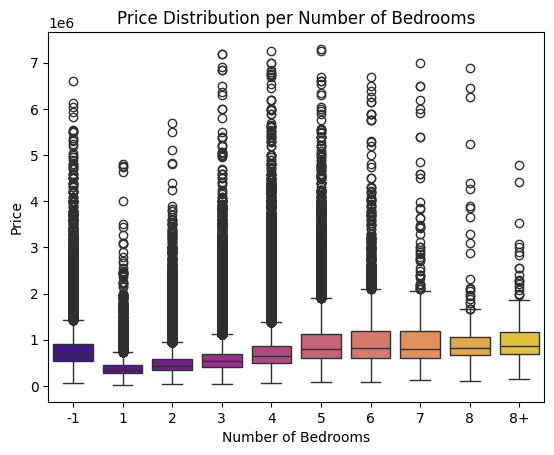

In [51]:
sns.boxplot(
    data=df_prep, x="new_br", y="price", hue="new_br",
    palette="plasma" # sequential palette
)
plt.title("Price Distribution per Number of Bedrooms")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price");

**Exploring Sold Houses Frequency**

Since each record in the dataset represents a home sale, we can identify how many times a house was sold by combining the city, zip code, and street address. Below are the ten most frequently sold houses:

In [52]:
(
    df_prep
    .groupby(["zip", "city", "street"], as_index=False)
    .size()
    .sort_values(by="size", ascending=False)
    .head(10)
)

,zip,city,street,size
80536,94510,Benicia,900 Cambridge Drive,86
220532,94610,Oakland,460 Crescent Street,43
198772,94591,Vallejo,1201 Glen Cove Parkway,37
244235,94903,San Rafael,100 Thorndale Drive,31
80555,94510,Benicia,900 Southampton Road,29
136804,94550,Livermore,1085 Murrieta Boulevard,27
195658,94589,Vallejo,355 Parkview Terrace,24
118016,94538,Fremont,39111 Guardino Drive,23
217151,94607,Oakland,801 Franklin Street,20
195056,94589,Vallejo,165 Oddstad Drive,17


For the most frequently sold house, we can plot how its sale price has changed over time:

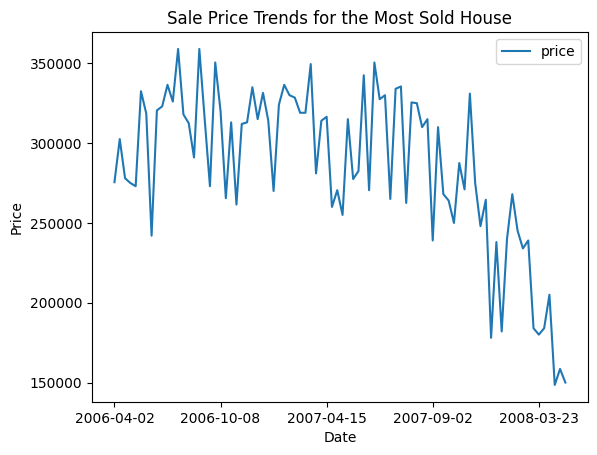

In [53]:
(
    df_prep.query("zip == '94510' and city == 'Benicia' and street == '900 Cambridge Drive'")
    .sort_values(by="date_sold")
    .plot(kind="line", x="date_sold", y="price")
)
plt.title("Sale Price Trends for the Most Sold House")
plt.xlabel("Date")
plt.ylabel("Price");

**Prices over Time**

The price trend shown above could be explained by the crash of U.S. housing bubble in 2008/2009. To further investigate this, we plot the median property prices over time. This new plot clearly illustrates the steady rise in prices from 2003 to 2007, followed by a sharp decline in 2008, aligning with the bubble burst

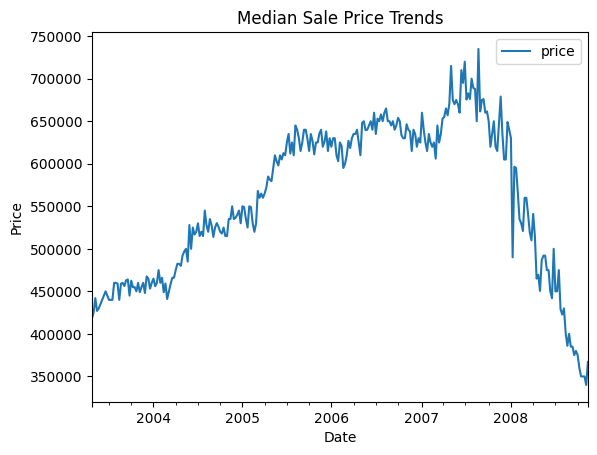

In [67]:
# Group by 'date_sold', calculate the median price, and plot it
(
    df_prep
    .assign(date_sold = lambda x: pd.to_datetime(x.date_sold)) # Ensure 'date_sold' is in datetime format
    .groupby("date_sold", as_index=False)["price"].median()
    .sort_values(by="date_sold")
    .plot(kind="line", x="date_sold", y="price")
)
# Add title and labels
plt.title("Median Sale Price Trends")
plt.xlabel("Date")
plt.ylabel("Price");

**Houses Sold per County and Year**

By processing the sale date variable, we can determine the number of houses sold each year in each county and visualize the results with a heatmap.

In [ ]:
df_prep.filter(items=["county", "date_sold"])

,county,date_sold
0,Alameda County,2004-08-29
1,Alameda County,2005-11-06
2,Alameda County,2003-09-21
3,Alameda County,2004-09-05
4,Alameda County,2005-07-31
...,...,...
521480,Sonoma County,2004-10-24
521484,Sonoma County,2008-03-30
521486,Sonoma County,2007-08-05
521489,Sonoma County,2005-05-15


In [ ]:
plot_data = df_prep.filter(items=["county", "date_sold"])
plot_data["year"] = [date.split("-")[0] for date in plot_data["date_sold"]]
plot_data

,county,date_sold,year
0,Alameda County,2004-08-29,2004
1,Alameda County,2005-11-06,2005
2,Alameda County,2003-09-21,2003
3,Alameda County,2004-09-05,2004
4,Alameda County,2005-07-31,2005
...,...,...,...
521480,Sonoma County,2004-10-24,2004
521484,Sonoma County,2008-03-30,2008
521486,Sonoma County,2007-08-05,2007
521489,Sonoma County,2005-05-15,2005


In [ ]:
plot_data_pivot = (
    plot_data
    .groupby(["county", "year"], as_index=False).size()
    .pivot(index="county", columns="year", values="size")
    .fillna(0)
    .reindex(county_ft.county)
)
plot_data_pivot

year,2003,2004,2005,2006,2007,2008
county,,,,,,
Santa Clara County,14181.0,26897.0,23722.0,17536.0,13258.0,9515.0
Contra Costa County,13327.0,21183.0,19536.0,14123.0,10471.0,10247.0
Alameda County,12637.0,23057.0,20661.0,15246.0,11426.0,9378.0
Solano County,5236.0,7833.0,7911.0,5555.0,3214.0,3532.0
San Mateo County,4842.0,7523.0,7812.0,6248.0,4833.0,3442.0
Sonoma County,5310.0,7526.0,6769.0,4832.0,3414.0,2914.0
San Francisco County,4448.0,6531.0,5733.0,4235.0,4096.0,3032.0
Marin County,2453.0,3739.0,3216.0,2673.0,2414.0,1617.0
Napa County,1192.0,1773.0,1603.0,1204.0,843.0,673.0


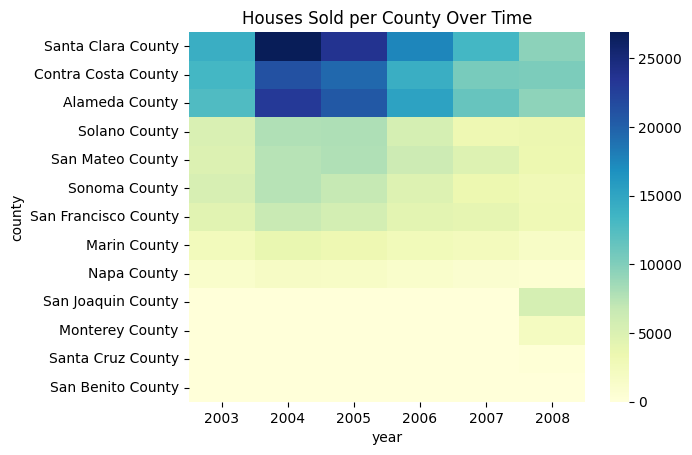

In [ ]:
sns.heatmap(
    data=plot_data_pivot,
    cmap="YlGnBu",
    #annot=True
)
plt.title("Houses Sold per County Over Time");
# check if the three first counties are close

**Reviewing House Prices and Sizes**

Since the price distribution is highly right-skewed, we can plot a histogram of the log-transformed sale prices. Log transformation often helps convert a right-skewed distribution into a more symmetric one.

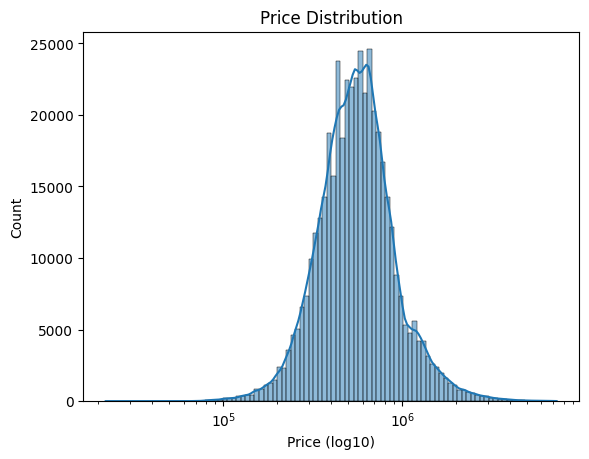

In [ ]:
sns.histplot(
    data=df_prep, x="price", kde=True,
    log_scale=True,
    bins=100
)
plt.title("Price Distribution")
plt.xlabel("Price (log10)");

Since house and lot size are likely related to price, we expect a positive log-log relationship between these variables. To explore this, we create a scatter plot of price versus building size, both log-transformed. As expected, the plot shows that larger houses generally cost more, with a clear log-log association between the two features.

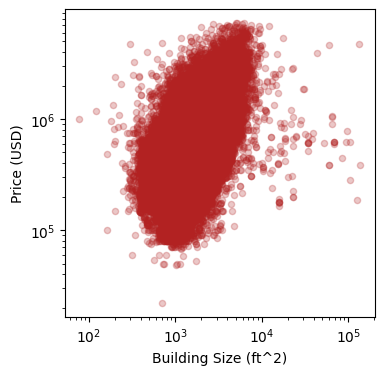

In [ ]:
df_prep.plot(
    kind="scatter", figsize=(4,4),
    x="bsqft", y="price",
    logx=True, logy=True,
    xlabel="Building Size (ft^2)", ylabel="Price (USD)",
    color="firebrick", alpha=0.25
);

**Prices per Counties**

The box plots below illustrate the relationship between counties and property prices. For convenience, boxplots are ordered by their median values. San Benito County stands out for having the least price variability, possibly due to its smaller number of recorded properties. Additionally, only three cities from this county are included in the dataset.

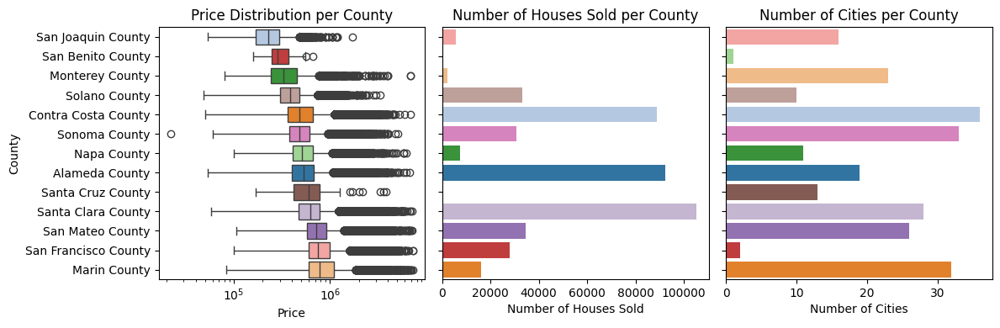

In [76]:
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(12, 4), dpi=100, sharex=False)

# County order based on median price
county_order = df_prep.groupby(["county"])["price"].median().sort_values().index

# Create a boxplot for price distribution per county
# in the first subplot
sns.boxplot(
    data=df_prep,
    x="price",
    y="county", hue="county",
    order=county_order,
    palette="tab20",
    ax=ax[0]
)
ax[0].set_xscale("log")
ax[0].set_title("Price Distribution per County")
ax[0].set_xlabel("Price")
ax[0].set_ylabel("County")

# Create a countplot for number of houses sold per county
# in the second subplot
sns.barplot(
    data=df_prep.groupby(["county"], as_index=False).size().rename(columns={"size": "n_houses"}),
    x="n_houses",
    y="county", hue="county",
    order=county_order,
    palette="tab20",
    ax=ax[1]
)
ax[1].set_title("Number of Houses Sold per County")
ax[1].set_xlabel("Number of Houses Sold")
ax[1].set_ylabel("")
ax[1].tick_params(axis="y", labelleft=False)  # Hide y-axis labels

# Create a countplot for the number of cities per county
# in the third subplot
sns.barplot(
    data=df_prep.groupby(["county"], as_index=False)["city"].nunique(),
    x="city",
    y="county", hue="county",
    order=county_order,
    palette="tab20",
    ax=ax[2]
)
ax[2].set_title("Number of Cities per County")
ax[2].set_xlabel("Number of Cities")
ax[2].set_ylabel("")
ax[2].tick_params(axis="y", labelleft=False)  # Hide y-axis labels

plt.tight_layout()

In [66]:
# Number of properties per county
df_prep.groupby(["county"]).size().sort_values(ascending=False)

county
Santa Clara County      105109
Alameda County           92405
Contra Costa County      88887
San Mateo County         34700
Solano County            33281
Sonoma County            30765
San Francisco County     28075
Marin County             16112
Napa County               7288
San Joaquin County        5499
Monterey County           2022
Santa Cruz County          239
San Benito County           28
dtype: int64

In [72]:
# Number of cities per county
df_prep.groupby(["county"], as_index=False)["city"].nunique().sort_values(by="city", ascending=False)

,county,city
1,Contra Costa County,36
12,Sonoma County,33
2,Marin County,32
9,Santa Clara County,28
8,San Mateo County,26
3,Monterey County,23
0,Alameda County,19
7,San Joaquin County,16
10,Santa Cruz County,13
4,Napa County,11


In [ ]:
#df_prep.query("county == 'San Francisco County'").city.unique()

array(['Daly City', 'San Francisco'], dtype=object)

**Prices per Cities**

The box plots below illustrate the relationship between various cities in the San Francisco East Bay and property prices. For clarity, the box plots are ordered by their median values. The plots reveal that cities in the northern (Richmond) and southern parts (Emeryville) of the bay generally have lower home prices, while those in the central bay tend to be more expensive.

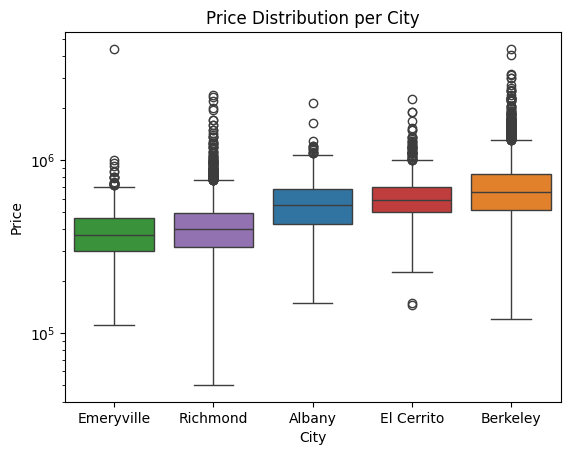

In [78]:
# Define the cities of interest
sf_east_bay_cities = ["Richmond", "El Cerrito", "Albany", "Berkeley", "Emeryville"]

# City order based on median price
city_order = df_prep.query("city in @sf_east_bay_cities").groupby(["city"])["price"].median().sort_values().index

# Create a boxplot for price distribution per city
sns.boxplot(
    data=df_prep.query("city in @sf_east_bay_cities"),
    x="city", y="price", hue="city",
    order=city_order,
    palette="tab10"
)
plt.yscale("log")
plt.title("Price Distribution per City")
plt.xlabel("City")
plt.ylabel("Price");

Next, we will analyze the relationship between **price per square foot** and house size using faceted scatterplots for five cities in the San Francisco East Bay. The data indicates that smaller houses generally have a higher cost per square foot. This relationship is approximately log-linear and negatively associated across all five locations. Notably, El Cerrito and Albany are the most expensive cities regarding price per square foot.

In [79]:
# Compute price per square foot
df_prep["price_per_sqft"] = df_prep["price"]/df_prep["bsqft"]

In [80]:
# Create the plot with facetting by city and ensure the order of the cities
fig = px.scatter(
    df_prep.query("city in @sf_east_bay_cities"),
    x="bsqft", y="price_per_sqft", log_y=True,
    category_orders={
        "city": sf_east_bay_cities # Ensure the order of cities
    },
    facet_col="city", # Create facets per city
    facet_col_spacing=0.05, # Increase space between facets
    #title="Number of Bedrooms Across SF East Bay Cities",
    #labels={"new_br": "Bedrooms"},
    width=1000, height=350
)

# Update the layout to focus in low values
fig.update_layout(xaxis_range=[0, 5500], yaxis_range=[1, 4])

# Show the plot
fig.show()

**Numerical Correlations**

Finally, we will create a heatmap to visualize the **correlations** between the numerical columns in the prepared dataset.

Correlation measures the strength and direction of a linear relationship between two variables, providing insight into how they may affect one another. The correlation coefficient ranges from -1 to 1, where:

- A coefficient close to `1` indicates a **strong positive correlation**, meaning that as one variable increases, the other variable also tends to increase.
- A coefficient close to `-1` indicates a **strong negative correlation**, suggesting that as one variable increases, the other variable tends to decrease.
- A coefficient around `0` suggests **no correlation**, indicating that the variables do not have a consistent relationship.

We can employ the **Pearson** or **Spearman** correlation methods for our analysis:
- The **Pearson method** assesses linear correlations, making it suitable for normally distributed data.
- The **Spearman method** evaluates monotonic relationships and is more robust to outliers, making it ideal for non-parametric data.

By analyzing this heatmap, we can identify significant relationships within our dataset, which can guide further analyses and help in making informed decisions. For example, we can observe that larger houses tend to have higher prices, or that the number of bedrooms is positively correlated with property size. Understanding these correlations can be crucial for predicting trends and making data-driven decisions.

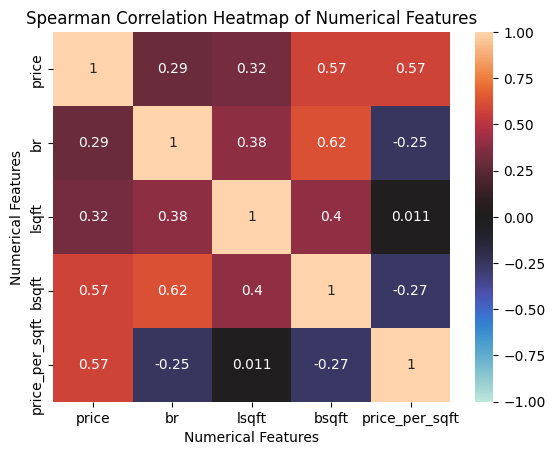

In [81]:
# Define the numerical columns to be analyzed
numerical_cols = ["price", "br", "lsqft", "bsqft", "price_per_sqft"]

# Create a correlation heatmap using the Spearman method
sns.heatmap(
    df_prep.filter(items=numerical_cols).corr(method="spearman"),
    annot=True,         # Annotate the heatmap with correlation coefficients
    center=0,           # Center the colormap at zero
    vmin=-1,            # Minimum value of the colormap scale
    vmax=1              # Maximum value of the colormap scale
)

# Optional: Title and labels can be added for better understanding
plt.title("Spearman Correlation Heatmap of Numerical Features")
plt.xlabel("Numerical Features")
plt.ylabel("Numerical Features");